# Part 1 : Products detection


In [1]:
# setup
 
#clone the repository of yolov5 => it's the last version of YOLO family
!git clone https://github.com/ultralytics/yolov5
 
# install dependencies
!pip install -qr yolov5/requirements.txt
%cd yolov5
 
import torch
#we need this module to display images
from IPython.display import Image, clear_output 
 
# And this to download models/datasets
#from google_utils import gdrive_download
 
print("SETUP COMPLETE !")

Cloning into 'yolov5'...
remote: Enumerating objects: 12115, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 12115 (delta 32), reused 36 (delta 18), pack-reused 12047
Receiving objects: 100% (12115/12115), 12.50 MiB | 1.99 MiB/s, done.
Resolving deltas: 100% (8323/8323), done.
     |████████████████████████████████| 1.6 MB 42.0 MB/s 
/content/yolov5
SETUP COMPLETE !


In [2]:
#Importing dataset from local into drive is so slow
#so I decided to use the roboflow plateform that makes this task simple and fast 

%cd /content
!curl -L "https://app.roboflow.com/ds/ZKIUwdxT6z?key=S2oXPIIWX1" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# the dataset is divided into 3 : 70% for training/20% for valid/and 10% for the test

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1309      0 --:--:-- --:--:-- --:--:--  1307
100 33.9M  100 33.9M    0     0  10.9M      0  0:00:03  0:00:03 --:--:-- 29.9M
Archive:  roboflow.zip
 extracting: test/images/047_jpg.rf.23d25d84d7f86066f571d75800348356.jpg  
 extracting: test/images/130_jpg.rf.2a690a87b0b8264a9991514f0b51065c.jpg  
 extracting: test/images/113_jpg.rf.13217d494f5be34b63d2518ec88306df.jpg  
 extracting: test/images/078_jpg.rf.068886b1f8fb0160c2aa8d895820f48d.jpg  
 extracting: test/images/049_jpg.rf.163e8727f1bdb3a1d63d031ffed96081.jpg  
 extracting: test/images/0053_jpg.rf.54933ee3c497a6e3c4c2a8ba84ec4c0e.jpg  
 extracting: test/images/59_jpg.rf.021fb42ea992f3a13b199cebe71fbf7c.jpg  
 extracting: test/images/104_jpg.rf.28d0f671a1982c6b9bae140d259fce28.jpg  
 extracting: test/images/235_jpg.rf.11def68bb03ed4bb

In [3]:
#The YAML file is used to describe data as shown below
# nc : 3 => we have 3 classes
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['cleaningProduct', 'electronic', 'food']

In [4]:
# define number of classes based on YAML because we gonna need this property after
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
# This is the model configuration
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [6]:
# magic functions are one of the cool features of IPython
from IPython.core.magic import register_line_cell_magic

#This function is useful to customize the configuration of the model
@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [7]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
# A convolutional neural network that aggregates 
# and forms image features at different granularities.
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
# Takes box and class prediction steps.
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [8]:
# train yolov5s on custom data for 200 epochs
# img define input image size
# batch: determine batch size
# epochs: define the number of training epochs
# data the y
# cfg the model configuration
# weights the path to weights
# name results_name
# 
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 200 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-73-g91a81d4 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_

In [9]:
#from utils.plots import plot_results 
#plot_results(save_dir='/content/yolov5/runs/train/yolov5s_results/')  # plot all results*.txt as results.png
#Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=800)

def plot_results(start=0, stop=0, bucket='', id=(), labels=(), save_dir=''):
    # from utils.general import *; plot_results(save_dir='runs/exp0')
    # Plot training 'results*.txt' as seen in https://github.com/ultralytics/yolov5#reproduce-our-training
    fig, ax = plt.subplots(2, 5, figsize=(12, 6))
    ax = ax.ravel()
    s = ['Box', 'Objectness', 'Classification', 'Precision', 'Recall',
         'val Box', 'val Objectness', 'val Classification', 'mAP@0.5', 'mAP@0.5:0.95']
    if bucket:
        # os.system('rm -rf storage.googleapis.com')
        # files = ['https://storage.googleapis.com/%s/results%g.txt' % (bucket, x) for x in id]
        files = ['results%g.txt' % x for x in id]
        c = ('gsutil cp ' + '%s ' * len(files) + '.') % tuple('gs://%s/results%g.txt' % (bucket, x) for x in id)
        os.system(c)
    else:
        files = glob.glob(str(Path(save_dir) / 'results*.txt')) + glob.glob('../../Downloads/results*.txt')
    assert len(files), 'No results.txt files found in %s, nothing to plot.' % os.path.abspath(save_dir)
    for fi, f in enumerate(files):
        try:
            results = np.loadtxt(f, usecols=[2, 3, 4, 8, 9, 12, 13, 14, 10, 11], ndmin=2).T
            n = results.shape[1]  # number of rows
            x = range(start, min(stop, n) if stop else n)
            for i in range(10):
                y = results[i, x]
                if i in [0, 1, 2, 5, 6, 7]:
                    y[y == 0] = np.nan  # don't show zero loss values
                    # y /= y[0]  # normalize
                label = labels[fi] if len(labels) else Path(f).stem
                ax[i].plot(x, y, marker='.', label=label, linewidth=1, markersize=6)
                ax[i].set_title(s[i])
                # if i in [5, 6, 7]:  # share train and val loss y axes
                #     ax[i].get_shared_y_axes().join(ax[i], ax[i - 5])
        except Exception as e:
            print('Warning: Plotting error for %s; %s' % (f, e))
    fig.tight_layout()
    ax[1].legend()
    fig.savefig(Path(save_dir) / 'results.png', dpi=200)

    ###########
def plot_results_overlay(start=0, stop=0):  # from utils.general import *; plot_results_overlay()
    # Plot training 'results*.txt', overlaying train and val losses
    s = ['train', 'train', 'train', 'Precision', 'mAP@0.5', 'val', 'val', 'val', 'Recall', 'mAP@0.5:0.95']  # legends
    t = ['Box', 'Objectness', 'Classification', 'P-R', 'mAP-F1']  # titles
    for f in sorted(glob.glob('results*.txt') + glob.glob('../../Downloads/results*.txt')):
        results = np.loadtxt(f, usecols=[2, 3, 4, 8, 9, 12, 13, 14, 10, 11], ndmin=2).T
        n = results.shape[1]  # number of rows
        x = range(start, min(stop, n) if stop else n)
        fig, ax = plt.subplots(1, 5, figsize=(14, 3.5), tight_layout=True)
        ax = ax.ravel()
        for i in range(5):
            for j in [i, i + 5]:
                y = results[j, x]
                ax[i].plot(x, y, marker='.', label=s[j])
                # y_smooth = butter_lowpass_filtfilt(y)
                # ax[i].plot(x, np.gradient(y_smooth), marker='.', label=s[j])

            ax[i].set_title(t[i])
            ax[i].legend()
            ax[i].set_ylabel(f) if i == 0 else None  # add filename
        fig.savefig(f.replace('.txt', '.png'), dpi=200)


In [10]:
import matplotlib
import matplotlib.pyplot as plt
from utils.general import *
plot_results_overlay()

In [11]:
%load_ext tensorboard
#!kill 1529
#%reload_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [13]:
%ls runs/train/yolov5s_results/weights/

best.pt  last.pt


In [14]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-73-g91a81d4 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7251912 parameters, 0 gradients
image 1/58 /content/test/images/00113_jpg.rf.c3ee4d85b01387e64d3b6c85161ee3d3.jpg: 416x416 1 electronic, 8.9ms
image 2/58 /content/test/images/00129_jpg.rf.bfec5e58e458cbaf73b47ad13eafa86d.jpg: 416x416 1 electronic, 9.1ms
image 3/58 /content/test/images/00161_jpg.rf.41707544374d0a727ecc833a54bea847.jpg: 416x416 1 cleaningProd

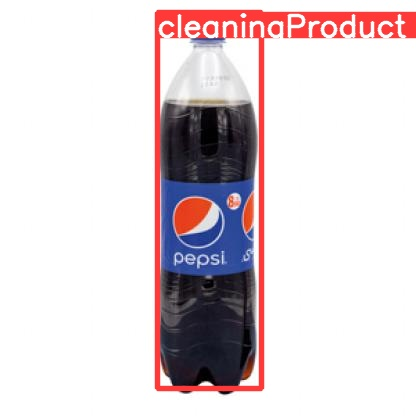

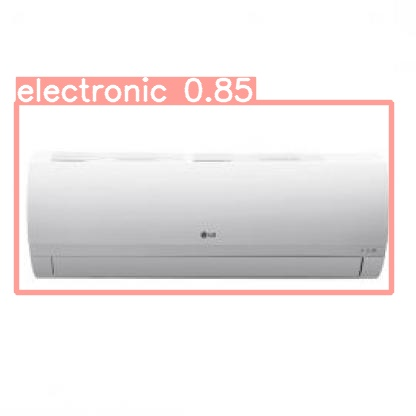

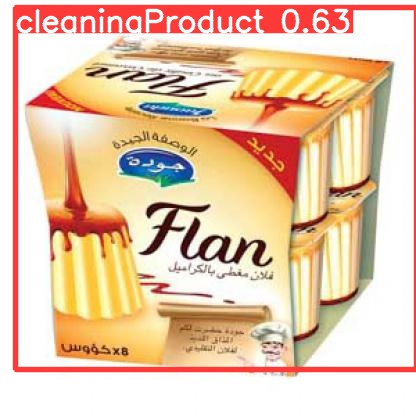

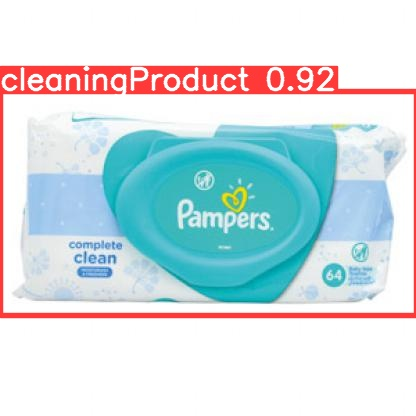

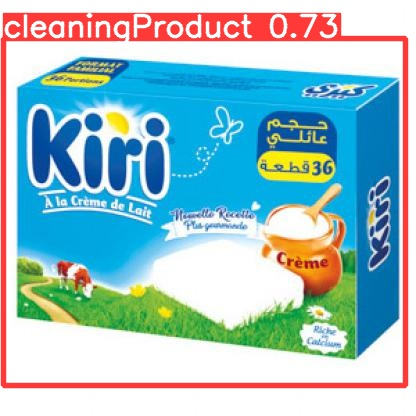

...

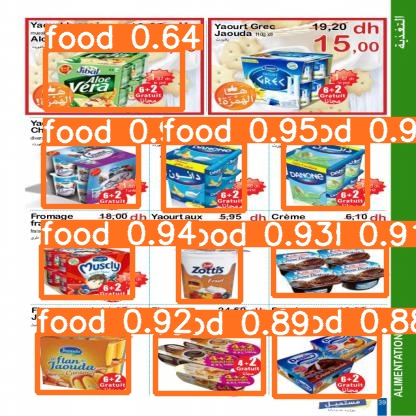

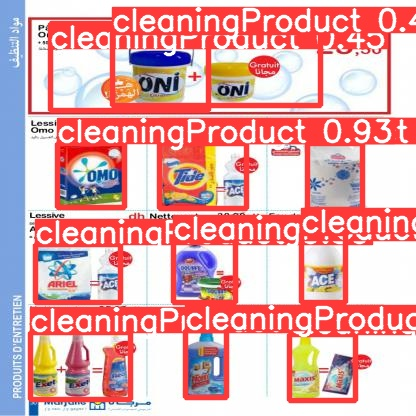

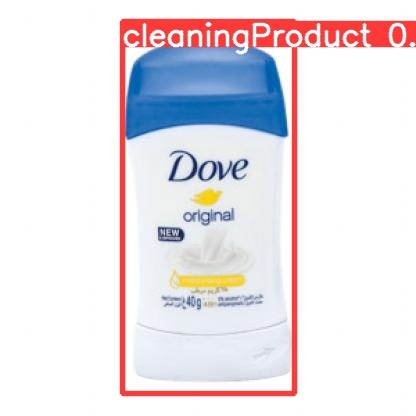

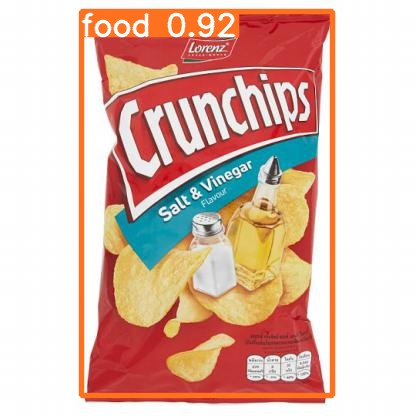

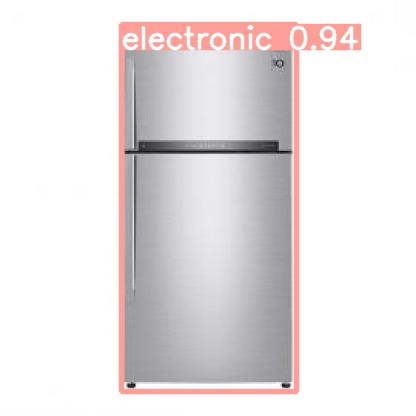

In [15]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
%cd /content/yolov5/
!python detect.py --weights /content/best.pt --img 416 --conf 0.4 --source /content/Marjane_003.jpg --save-txt

In [ ]:
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")


In [ ]:
import pandas as pd
for txt in glob.glob('/content/yolov5/inference/output/*.txt'):
  with open(txt, 'r') as original: data = original.read()
  with open(txt, 'w') as modified: modified.write("Categorie x y width height NaN\n" + data)
  data = pd.read_csv(txt, sep=' ')


In [ ]:
data

In [ ]:
cmptc = 0 # for cleaning product
cmptf = 0 # for food
cmpte = 0 # for electronic
for i in range(len(data['Categorie'])):
  if data['Categorie'][i] == 1:
    cmpte = cmpte + 1
  elif data['Categorie'][i] == 0:
    cmptc = cmptc + 1
  elif data['Categorie'][i] == 2:
    cmptf = cmptf + 1


In [ ]:
df = pd.read_csv("/content/file.csv", sep = ',')
def recommend(categorie):
  for i in range(len(df)):
    if df[categorie][i] == 1:
      display(Image(filename=df['URL'][i] ))
      print('\n')

In [ ]:
#detect the max to display similar images
print("Similar sales flyers \n")
m = max(cmptc, cmpte, cmptf)
if m == cmpte :
  recommend('Electronic')
elif m == cmptf:
  recommend('Food')
elif m == cmptc:
  recommend('CleaningProduct')


# Part 2 : Text Detection

In [ ]:
import requests


def ocr_space_file(filename, overlay=True, api_key='2bedc4023488957', language='eng'):
    """ OCR.space API request with local file.
        Python3.5 - not tested on 2.7
    :param filename: Your file path & name.
    :param overlay: Is OCR.space overlay required in your response.
                    Defaults to False.
    :param api_key: OCR.space API key.
                    Defaults to 'helloworld'.
    :param language: Language code to be used in OCR.
                    List of available language codes can be found on https://ocr.space/OCRAPI
                    Defaults to 'en'.
    :return: Result in JSON format.
    """

    payload = {'isOverlayRequired': overlay,
               'apikey': api_key,
               'language': language,
               }
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f},
                          data=payload,
                          )
    return r.content.decode()

In [ ]:
test_url_fr = ocr_space_file(filename='/content/2.jpg', language='fre')
#test_url_ar = ocr_space_file(filename = '/content/2.jpg', language = 'ara')
#it's working !!

In [ ]:
print(test_url_fr)

{"ParsedResults":[{"TextOverlay":{"Lines":[{"LineText":"Boisson au jus de poire.","Words":[{"WordText":"Boisson","Left":31.0,"Top":266.0,"Height":24.0,"Width":96.0},{"WordText":"au","Left":137.0,"Top":272.0,"Height":18.0,"Width":28.0},{"WordText":"jus","Left":173.0,"Top":266.0,"Height":29.0,"Width":37.0},{"WordText":"de","Left":219.0,"Top":266.0,"Height":24.0,"Width":29.0},{"WordText":"poire.","Left":257.0,"Top":266.0,"Height":29.0,"Width":68.0}],"MaxHeight":29.0,"MinTop":266.0},{"LineText":"la brique de 1 L.","Words":[{"WordText":"la","Left":31.0,"Top":326.0,"Height":17.0,"Width":14.0},{"WordText":"brique","Left":50.0,"Top":326.0,"Height":22.0,"Width":50.0},{"WordText":"de","Left":105.0,"Top":326.0,"Height":17.0,"Width":18.0},{"WordText":"1","Left":129.0,"Top":326.0,"Height":17.0,"Width":6.0},{"WordText":"L.","Left":142.0,"Top":326.0,"Height":17.0,"Width":13.0}],"MaxHeight":22.0,"MinTop":326.0},{"LineText":"460","Words":[{"WordText":"460","Left":190.0,"Top":489.0,"Height":77.0,"Width"

In [ ]:
import json
mydict = json.loads(test_url_fr)
#print(mydict) 
list = mydict.get('ParsedResults')
str = list[0]
type(str)
l2 = str.get('TextOverlay')
Useful_data = l2.get('Lines')
#type(Useful_data) => list
len(Useful_data)
Useful_data


[{'LineText': 'Boisson au jus de poire.',
  'MaxHeight': 29.0,
  'MinTop': 266.0,
  'Words': [{'Height': 24.0,
    'Left': 31.0,
    'Top': 266.0,
    'Width': 96.0,
    'WordText': 'Boisson'},
   {'Height': 18.0,
    'Left': 137.0,
    'Top': 272.0,
    'Width': 28.0,
    'WordText': 'au'},
   {'Height': 29.0,
    'Left': 173.0,
    'Top': 266.0,
    'Width': 37.0,
    'WordText': 'jus'},
   {'Height': 24.0,
    'Left': 219.0,
    'Top': 266.0,
    'Width': 29.0,
    'WordText': 'de'},
   {'Height': 29.0,
    'Left': 257.0,
    'Top': 266.0,
    'Width': 68.0,
    'WordText': 'poire.'}]},
 {'LineText': 'la brique de 1 L.',
  'MaxHeight': 22.0,
  'MinTop': 326.0,
  'Words': [{'Height': 17.0,
    'Left': 31.0,
    'Top': 326.0,
    'Width': 14.0,
    'WordText': 'la'},
   {'Height': 22.0,
    'Left': 50.0,
    'Top': 326.0,
    'Width': 50.0,
    'WordText': 'brique'},
   {'Height': 17.0,
    'Left': 105.0,
    'Top': 326.0,
    'Width': 18.0,
    'WordText': 'de'},
   {'Height': 17.0,


In [ ]:
Left = []
for i in Useful_data:
  #str = i
  List_words = i.get('Words')
  Left.append(List_words[0].get('Left'))
  #print("***")
  #str = list_words[i]
  #print(str.get('Left'))
#len(Left)

In [ ]:
#Store each Line text/max Height/min height into a dataframe
import pandas as pd
df = pd.DataFrame(Useful_data)
del df['Words']
del df['MaxHeight']
df['Left'] = Left
dk = df.sort_values(by = 'MinTop')
dk['etat'] = 0
#print(dk.head())
dk.reset_index(drop=True, inplace=True)
#dk['etat'][0]
dk

In [ ]:
display = []
count = 0
def LeftComparaison(left, index, display):
  while index != len(dk):
    if dk['etat'][index] != 1:
      if dk['Left'][index] - 1 == left or dk['Left'][index] + 1== left or dk['Left'][index] == left:
        display.append(dk['LineText'][index])
        dk['etat'][index] = 1
        #count = count + 1
    index = index + 1

while count != len(dk):
  for i in range(len(dk)):
    if dk['etat'][i] == 0:
      display.append(dk['LineText'][i])
      dk.at[i, 'etat'] = 1
      #print(dk['etat'][i])
      LeftComparaison(dk['Left'][i], i+1, display)
    count = count + 1
      #call a function to complete the work 
display                  